In [10]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0)

def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    image_shifted = image_tensor
    image_unflat = image_shifted.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

In [11]:
def crop(image, new_shape):
    
    middle_height = image.shape[2] // 2
    middle_width = image.shape[3] // 2
    starting_height = middle_height - round(new_shape[2] / 2)
    final_height = starting_height + new_shape[2]
    starting_width = middle_width - round(new_shape[3] / 2)
    final_width = starting_width + new_shape[3]
    cropped_image = image[:, :, starting_height:final_height, starting_width:final_width]
    return cropped_image

class ContractingBlock(nn.Module):
    def __init__(self, input_channels, use_dropout=False, use_bn=True):
        super(ContractingBlock, self).__init__()
        self.conv1 = nn.Conv2d(input_channels, input_channels * 2, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(input_channels * 2, input_channels * 2, kernel_size=3, padding=1)
        self.activation = nn.LeakyReLU(0.2)
        self.maxpool = nn.MaxPool2d(kernel_size=2, stride=2)
        if use_bn:
            self.batchnorm = nn.BatchNorm2d(input_channels * 2)
        self.use_bn = use_bn
        if use_dropout:
            self.dropout = nn.Dropout()
        self.use_dropout = use_dropout

    def forward(self, x):
        x = self.conv1(x)
        if self.use_bn:
            x = self.batchnorm(x)
        if self.use_dropout:
            x = self.dropout(x)
        x = self.activation(x)
        x = self.conv2(x)
        if self.use_bn:
            x = self.batchnorm(x)
        if self.use_dropout:
            x = self.dropout(x)
        x = self.activation(x)
        x = self.maxpool(x)
        return x

class ExpandingBlock(nn.Module):
    
    def __init__(self, input_channels, use_dropout=False, use_bn=True):
        super(ExpandingBlock, self).__init__()
        self.upsample = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
        self.conv1 = nn.Conv2d(input_channels, input_channels // 2, kernel_size=2)
        self.conv2 = nn.Conv2d(input_channels, input_channels // 2, kernel_size=3, padding=1)
        self.conv3 = nn.Conv2d(input_channels // 2, input_channels // 2, kernel_size=2, padding=1)
        if use_bn:
            self.batchnorm = nn.BatchNorm2d(input_channels // 2)
        self.use_bn = use_bn
        self.activation = nn.ReLU()
        if use_dropout:
            self.dropout = nn.Dropout()
        self.use_dropout = use_dropout

    def forward(self, x, skip_con_x):
        
        x = self.upsample(x)
        x = self.conv1(x)
        skip_con_x = crop(skip_con_x, x.shape)
        x = torch.cat([x, skip_con_x], axis=1)
        x = self.conv2(x)
        if self.use_bn:
            x = self.batchnorm(x)
        if self.use_dropout:
            x = self.dropout(x)
        x = self.activation(x)
        x = self.conv3(x)
        if self.use_bn:
            x = self.batchnorm(x)
        if self.use_dropout:
            x = self.dropout(x)
        x = self.activation(x)
        return x

class FeatureMapBlock(nn.Module):
    
    def __init__(self, input_channels, output_channels):
        super(FeatureMapBlock, self).__init__()
        self.conv = nn.Conv2d(input_channels, output_channels, kernel_size=1)

    def forward(self, x):
        
        x = self.conv(x)
        return x

class UNet(nn.Module):
    
    def __init__(self, input_channels, output_channels, hidden_channels=32):
        super(UNet, self).__init__()
        self.upfeature = FeatureMapBlock(input_channels, hidden_channels)
        self.contract1 = ContractingBlock(hidden_channels, use_dropout=True)
        self.contract2 = ContractingBlock(hidden_channels * 2, use_dropout=True)
        self.contract3 = ContractingBlock(hidden_channels * 4, use_dropout=True)
        self.contract4 = ContractingBlock(hidden_channels * 8)
        self.contract5 = ContractingBlock(hidden_channels * 16)
        self.contract6 = ContractingBlock(hidden_channels * 32)
        self.expand0 = ExpandingBlock(hidden_channels * 64)
        self.expand1 = ExpandingBlock(hidden_channels * 32)
        self.expand2 = ExpandingBlock(hidden_channels * 16)
        self.expand3 = ExpandingBlock(hidden_channels * 8)
        self.expand4 = ExpandingBlock(hidden_channels * 4)
        self.expand5 = ExpandingBlock(hidden_channels * 2)
        self.downfeature = FeatureMapBlock(hidden_channels, output_channels)
        self.sigmoid = torch.nn.Sigmoid()

    def forward(self, x):
        
        x0 = self.upfeature(x)
        x1 = self.contract1(x0)
        x2 = self.contract2(x1)
        x3 = self.contract3(x2)
        x4 = self.contract4(x3)
        x5 = self.contract5(x4)
        x6 = self.contract6(x5)
        x7 = self.expand0(x6, x5)
        x8 = self.expand1(x7, x4)
        x9 = self.expand2(x8, x3)
        x10 = self.expand3(x9, x2)
        x11 = self.expand4(x10, x1)
        x12 = self.expand5(x11, x0)
        xn = self.downfeature(x12)
        return self.sigmoid(xn)

In [12]:
class Discriminator(nn.Module):
   
    def __init__(self, input_channels, hidden_channels=8):
        super(Discriminator, self).__init__()
        self.upfeature = FeatureMapBlock(input_channels, hidden_channels)
        self.contract1 = ContractingBlock(hidden_channels, use_bn=False)
        self.contract2 = ContractingBlock(hidden_channels * 2)
        self.contract3 = ContractingBlock(hidden_channels * 4)
        self.contract4 = ContractingBlock(hidden_channels * 8)
        #### START CODE HERE ####
        self.final = nn.Conv2d(hidden_channels * 16, 1, kernel_size=1)
        #### END CODE HERE ####

    def forward(self, x, y):
        x = torch.cat([x, y], axis=1)
        x0 = self.upfeature(x)
        x1 = self.contract1(x0)
        x2 = self.contract2(x1)
        x3 = self.contract3(x2)
        x4 = self.contract4(x3)
        xn = self.final(x4)
        return xn

In [13]:
import torch.nn.functional as F
# New parameters
adv_criterion = nn.BCEWithLogitsLoss() 
recon_criterion = nn.L1Loss() 
lambda_recon = 200

n_epochs = 20
input_dim = 3
real_dim = 3
display_step = 200
batch_size = 4
lr = 0.0002
target_shape = 256
device = 'cuda'

In [14]:
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.CenterCrop(size=(256, 256)),
    #transforms.Grayscale(3),
])

import torchvision
dataset = torchvision.datasets.ImageFolder("/kaggle/input/animal-faces/afhq/train", transform=transform)

In [15]:
gen = UNet(input_dim, real_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator(input_dim + real_dim).to(device)
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

def weights_init(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
    if isinstance(m, nn.BatchNorm2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
        torch.nn.init.constant_(m.bias, 0)

# Feel free to change pretrained to False if you're training the model from scratch
pretrained = False
if pretrained:
    loaded_state = torch.load("pix2pix_15000.pth")
    gen.load_state_dict(loaded_state["gen"])
    gen_opt.load_state_dict(loaded_state["gen_opt"])
    disc.load_state_dict(loaded_state["disc"])
    disc_opt.load_state_dict(loaded_state["disc_opt"])
else:
    gen = gen.apply(weights_init)

In [16]:

def get_gen_loss(gen, disc, real, condition, adv_criterion, recon_criterion, lambda_recon):
   
    # Steps: 1) Generate the fake images, based on the conditions.
    #        2) Evaluate the fake images and the condition with the discriminator.
    #        3) Calculate the adversarial and reconstruction losses.
    #        4) Add the two losses, weighting the reconstruction loss appropriately.
    
    fake = gen(condition)
    disc_fake_hat = disc(fake, condition)
    gen_adv_loss = adv_criterion(disc_fake_hat, torch.ones_like(disc_fake_hat))
    gen_loss=gen_adv_loss+lambda_recon*recon_criterion(gen(condition),real)
    
    return gen_loss

  0%|          | 0/3658 [00:00<?, ?it/s]

Pretrained initial state


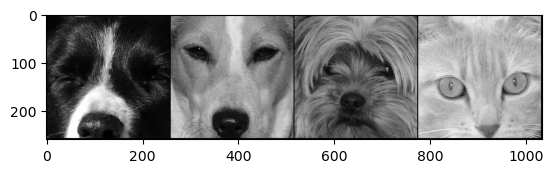

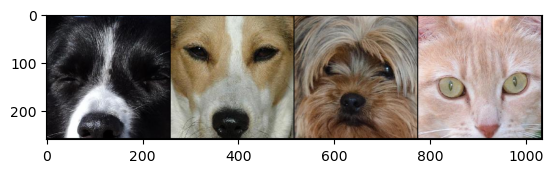

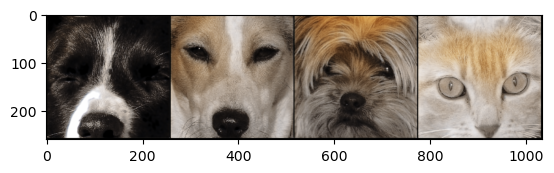

Epoch 0: Step 200: Generator (U-Net) loss: 11.173346040248864, Discriminator loss: 0.4869177391380073


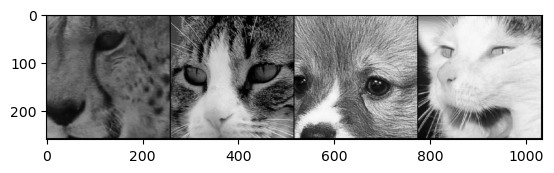

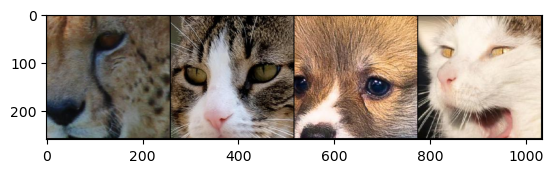

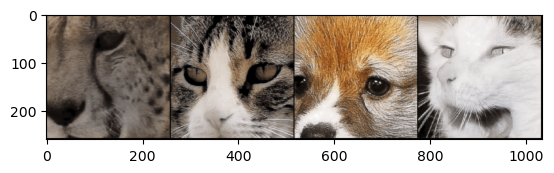

Epoch 0: Step 400: Generator (U-Net) loss: 11.579875633716583, Discriminator loss: 0.5057701073586942


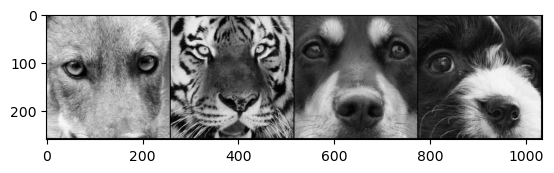

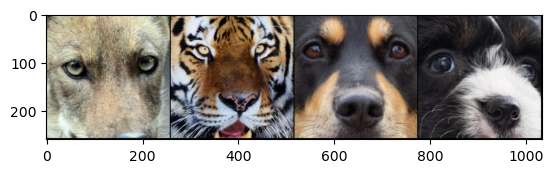

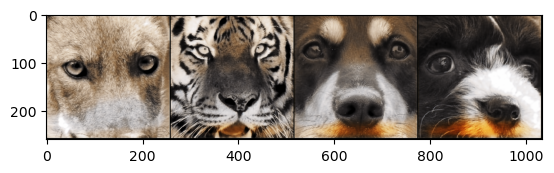

Epoch 0: Step 600: Generator (U-Net) loss: 11.641276779174808, Discriminator loss: 0.5031177243217829


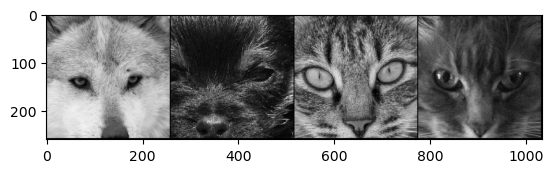

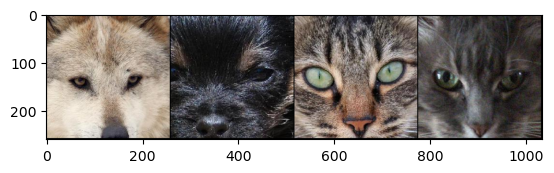

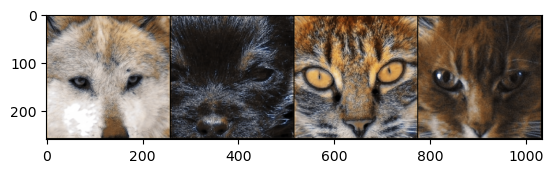

Epoch 0: Step 800: Generator (U-Net) loss: 11.54255464553833, Discriminator loss: 0.4717864386364816


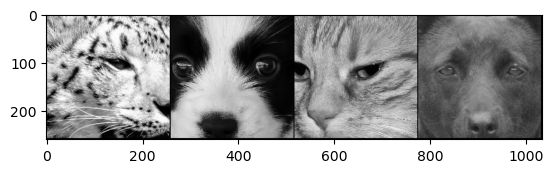

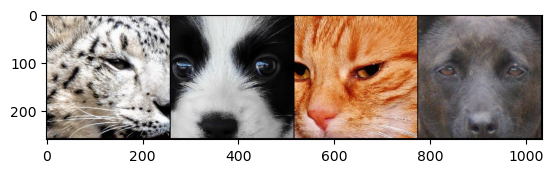

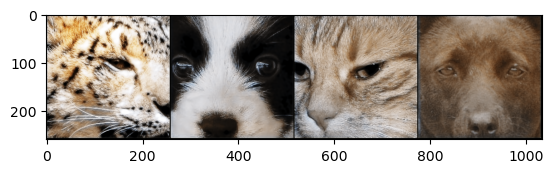

Epoch 0: Step 1000: Generator (U-Net) loss: 11.18977312088012, Discriminator loss: 0.5312629459798338


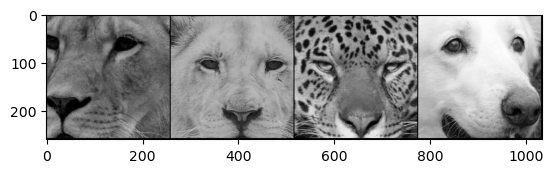

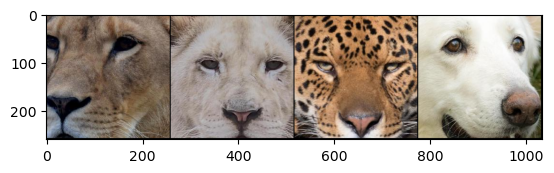

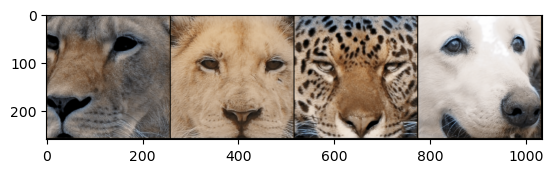

Epoch 0: Step 1200: Generator (U-Net) loss: 11.076934716701503, Discriminator loss: 0.4864418910443779


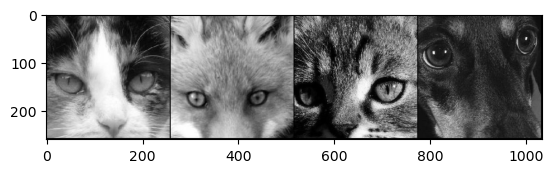

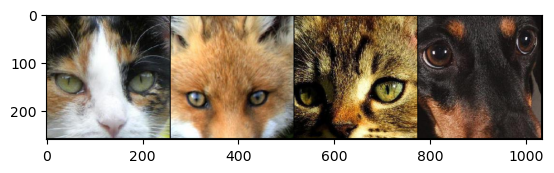

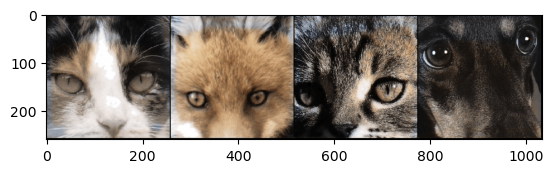

Epoch 0: Step 1400: Generator (U-Net) loss: 11.855071136951453, Discriminator loss: 0.3495013516396285


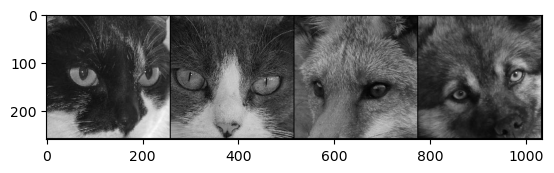

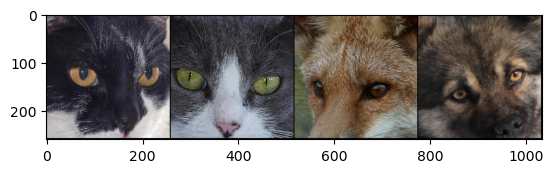

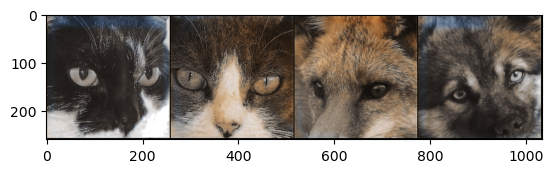

Epoch 0: Step 1600: Generator (U-Net) loss: 12.281225929260252, Discriminator loss: 0.17101150698959822


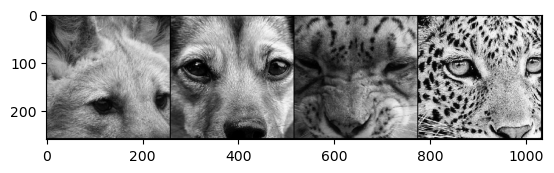

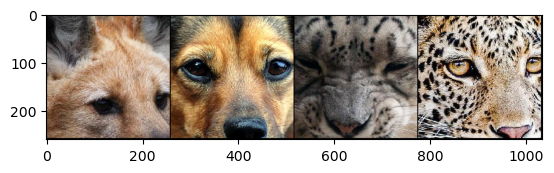

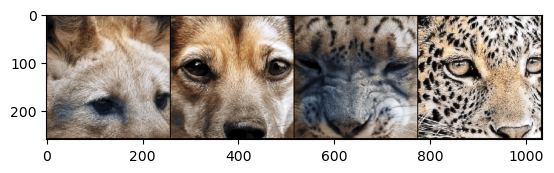

Epoch 0: Step 1800: Generator (U-Net) loss: 12.415056583881384, Discriminator loss: 0.11843438810668881


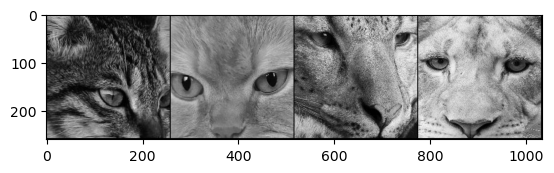

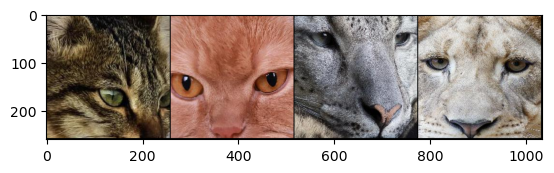

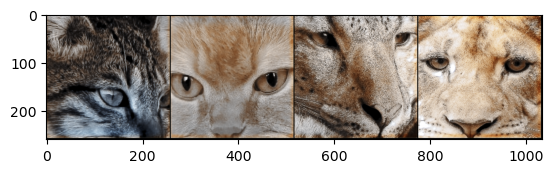

Epoch 0: Step 2000: Generator (U-Net) loss: 13.83134245872498, Discriminator loss: 0.01363712707767263


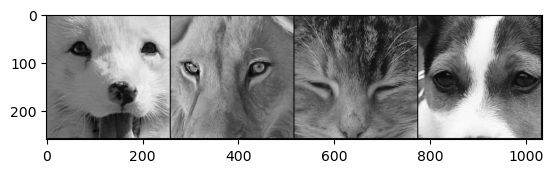

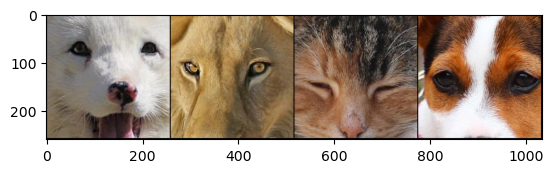

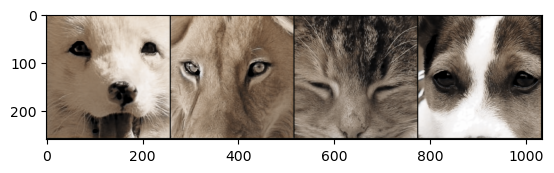

Epoch 0: Step 2200: Generator (U-Net) loss: 14.199405369758603, Discriminator loss: 0.006701247111195697


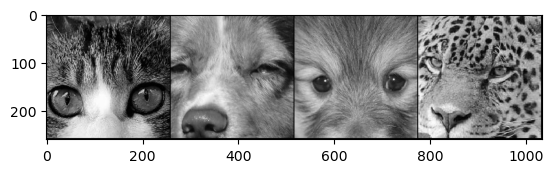

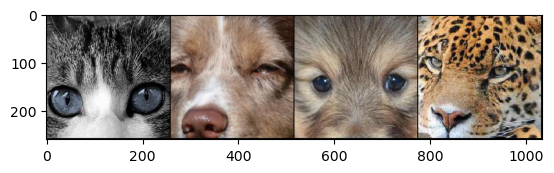

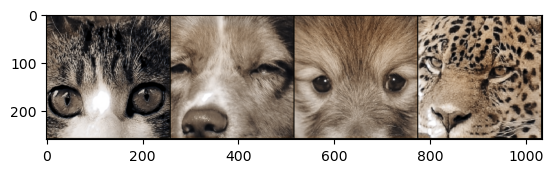

Epoch 0: Step 2400: Generator (U-Net) loss: 14.45794911384583, Discriminator loss: 0.005342341666109863


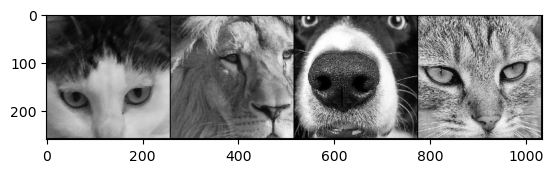

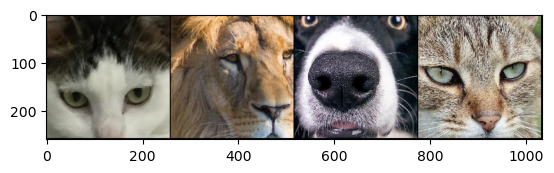

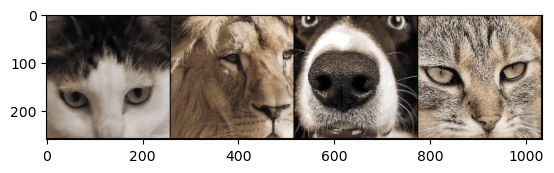

Epoch 0: Step 2600: Generator (U-Net) loss: 15.14324187278748, Discriminator loss: 0.003986219324870036


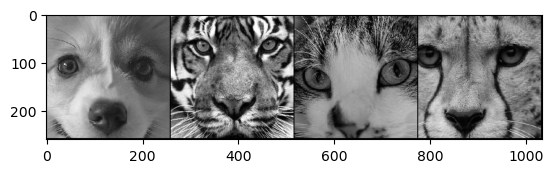

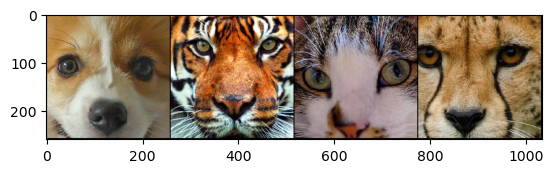

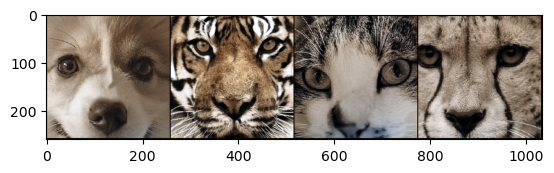

Epoch 0: Step 2800: Generator (U-Net) loss: 15.205467743873601, Discriminator loss: 0.0033910703571746123


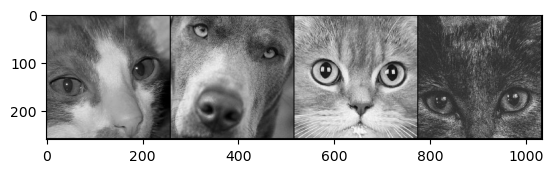

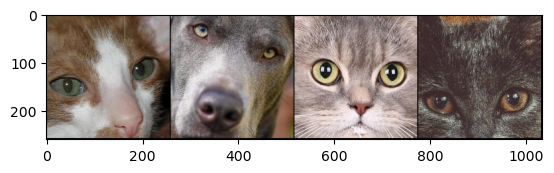

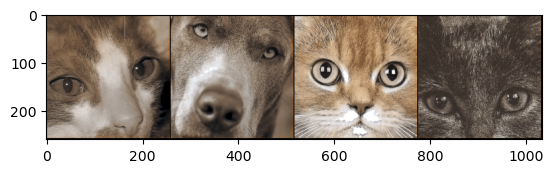

Epoch 0: Step 3000: Generator (U-Net) loss: 15.605288410186771, Discriminator loss: 0.0030190062097972255


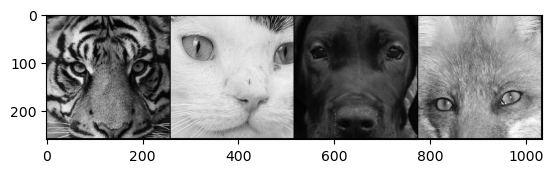

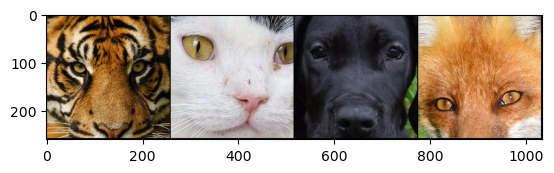

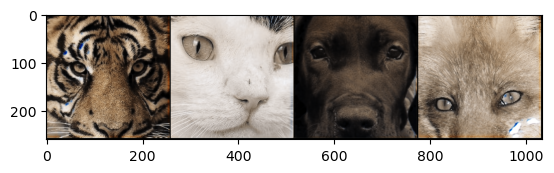

Epoch 0: Step 3200: Generator (U-Net) loss: 15.72831365585327, Discriminator loss: 0.002771039088838733


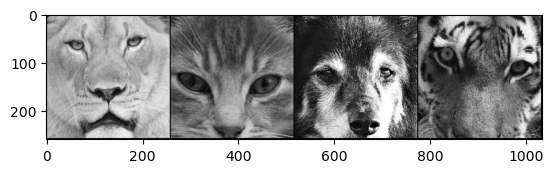

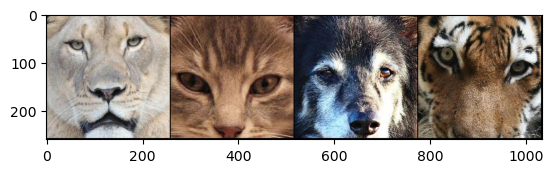

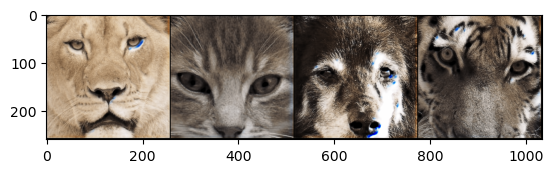

Epoch 0: Step 3400: Generator (U-Net) loss: 15.875637497901906, Discriminator loss: 0.002168880350654944


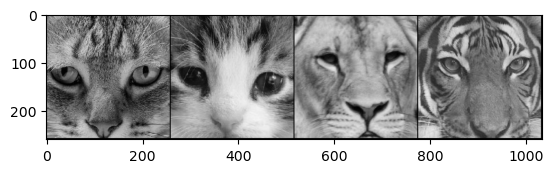

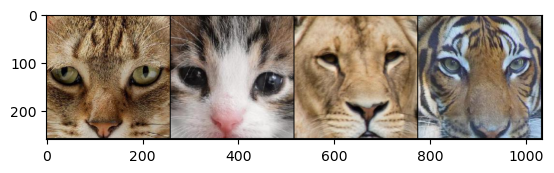

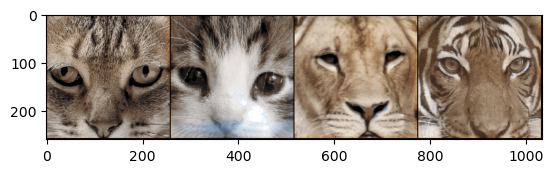

Epoch 0: Step 3600: Generator (U-Net) loss: 16.112793188095086, Discriminator loss: 0.0022158412105636677


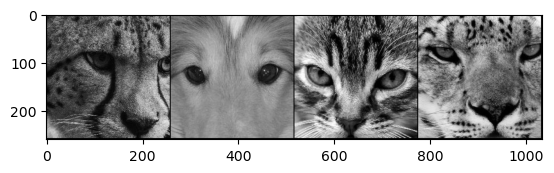

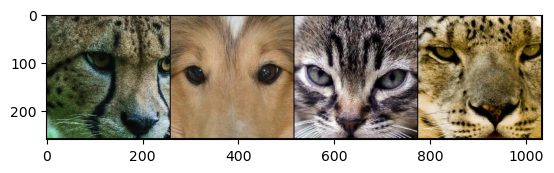

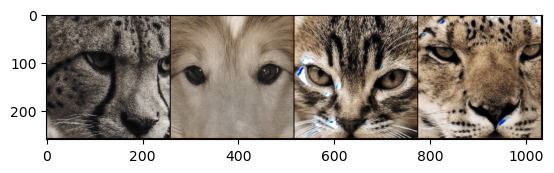

  0%|          | 0/3658 [00:00<?, ?it/s]

Epoch 1: Step 3800: Generator (U-Net) loss: 16.360072946548463, Discriminator loss: 0.0016442225192440678


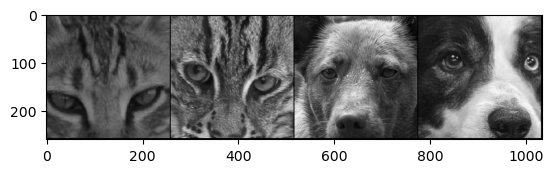

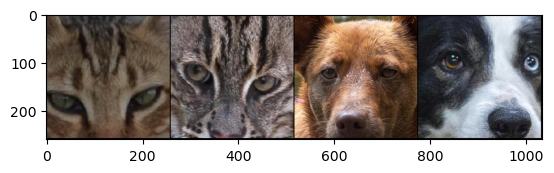

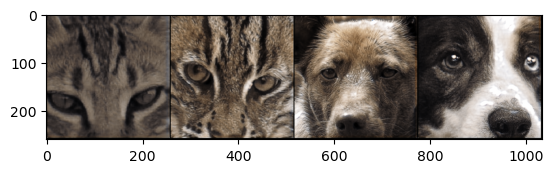

Epoch 1: Step 4000: Generator (U-Net) loss: 16.560270309448246, Discriminator loss: 0.0012637163273757322


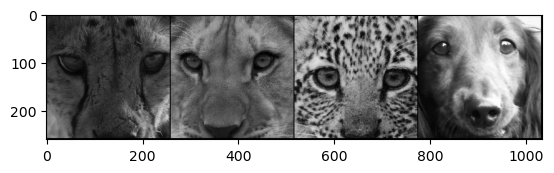

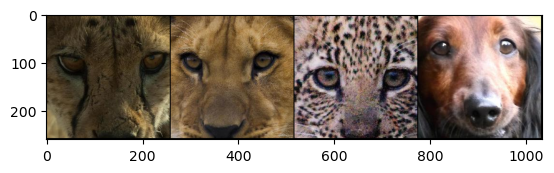

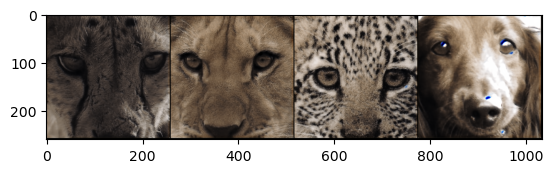

Epoch 1: Step 4200: Generator (U-Net) loss: 16.718163409233103, Discriminator loss: 0.0011587599321501332


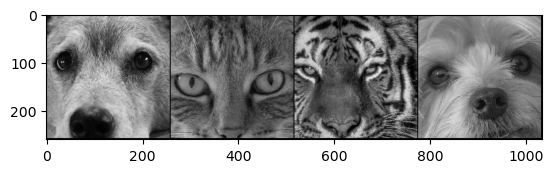

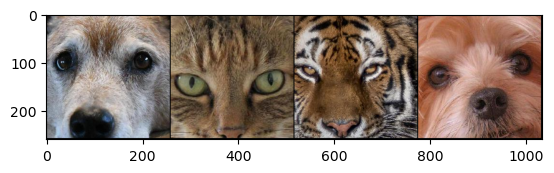

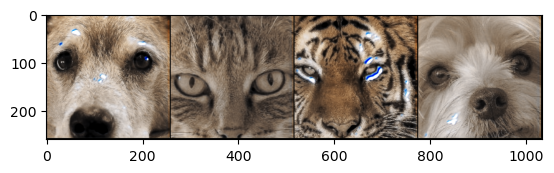

Epoch 1: Step 4400: Generator (U-Net) loss: 16.331313400268556, Discriminator loss: 0.0010524112576968043


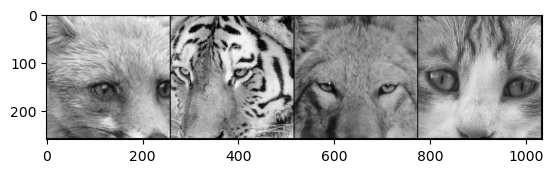

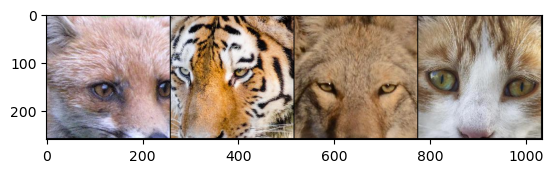

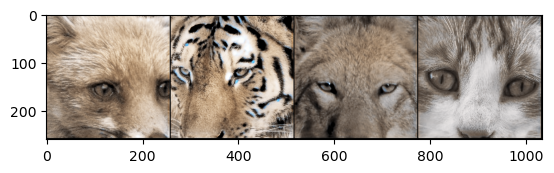

Epoch 1: Step 4600: Generator (U-Net) loss: 16.837263836860654, Discriminator loss: 0.0010485862886707759


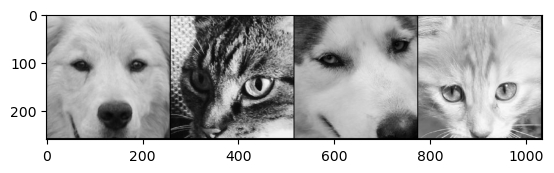

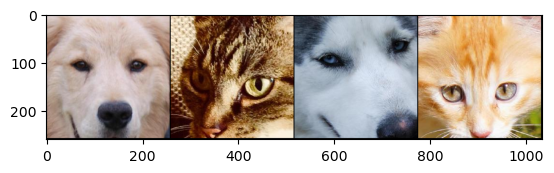

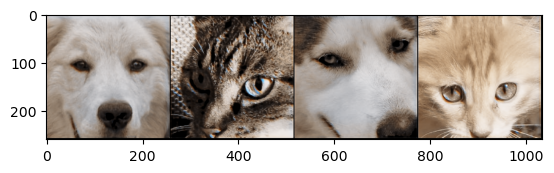

Epoch 1: Step 4800: Generator (U-Net) loss: 16.795926179885875, Discriminator loss: 0.0009668563440209259


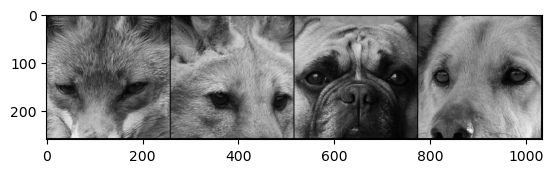

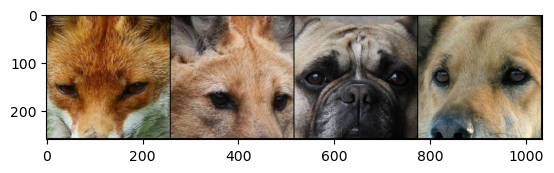

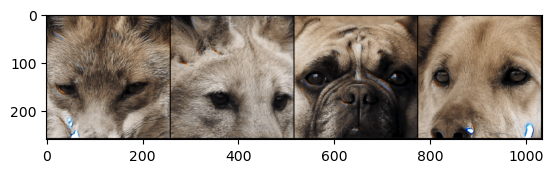

Epoch 1: Step 5000: Generator (U-Net) loss: 17.150558342933653, Discriminator loss: 0.0008213352441089224


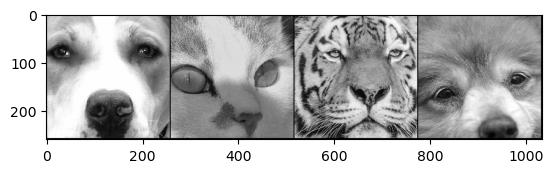

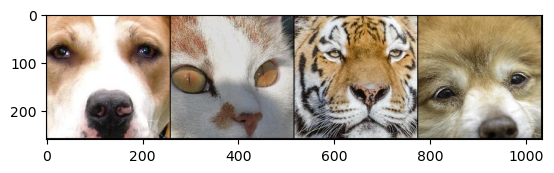

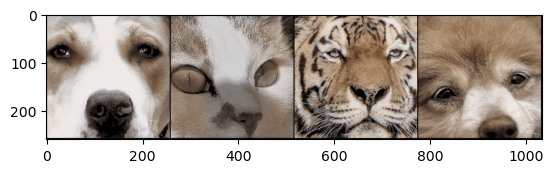

Epoch 1: Step 5200: Generator (U-Net) loss: 16.817754025459305, Discriminator loss: 0.0007068052965041716


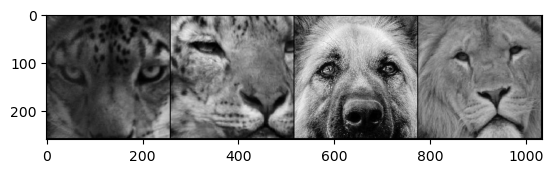

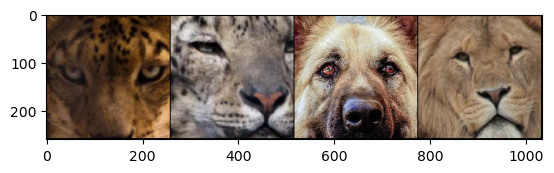

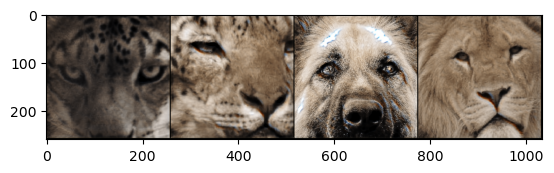

Epoch 1: Step 5400: Generator (U-Net) loss: 16.757371454238907, Discriminator loss: 0.0006736515583179426


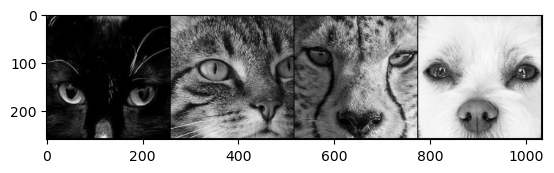

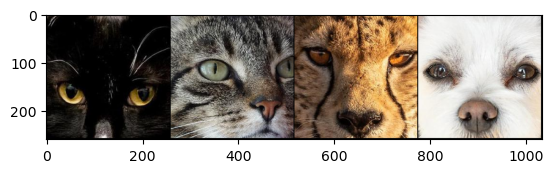

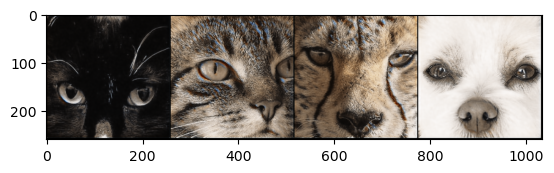

Epoch 1: Step 5600: Generator (U-Net) loss: 17.054580173492432, Discriminator loss: 0.0006264974358782642


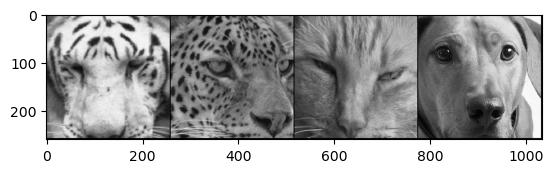

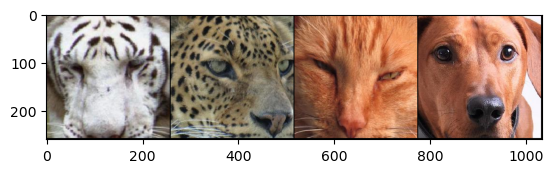

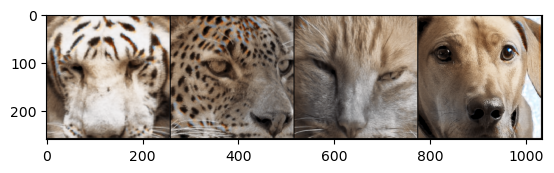

Epoch 1: Step 5800: Generator (U-Net) loss: 17.164521994590764, Discriminator loss: 0.0006158934888662772


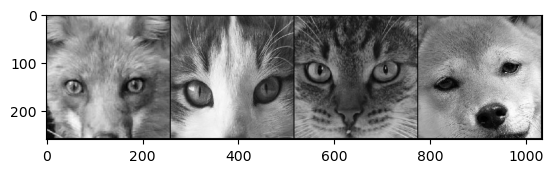

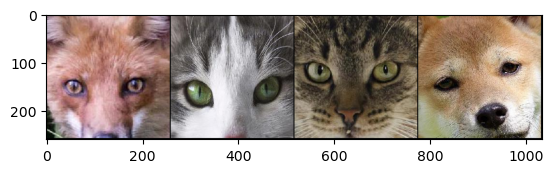

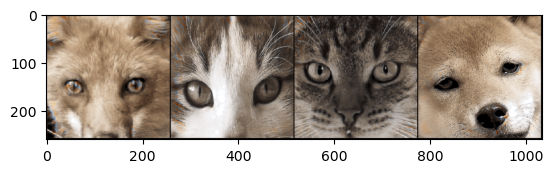

Epoch 1: Step 6000: Generator (U-Net) loss: 17.168018822669993, Discriminator loss: 0.0005324490564817096


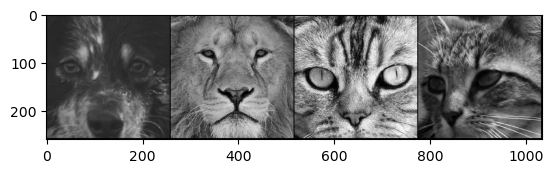

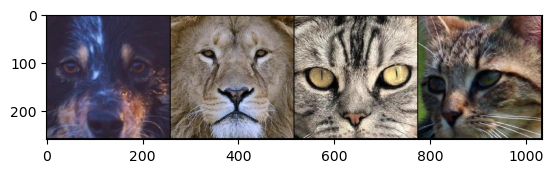

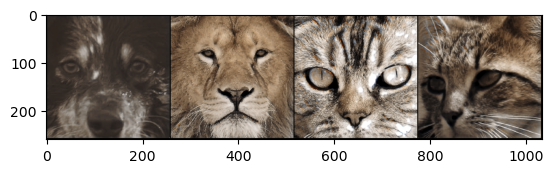

Epoch 1: Step 6200: Generator (U-Net) loss: 15.657341823577873, Discriminator loss: 0.14490227352609508


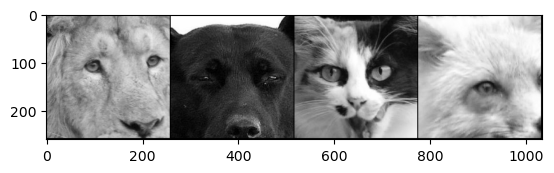

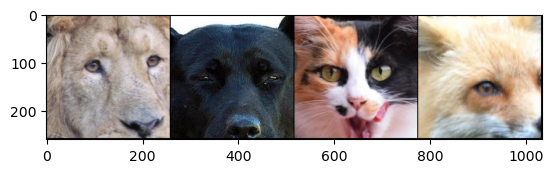

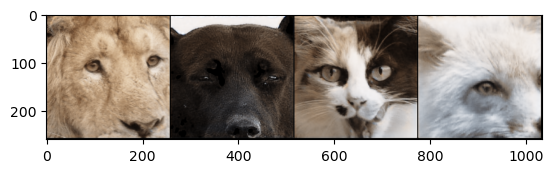

Epoch 1: Step 6400: Generator (U-Net) loss: 10.43056095600128, Discriminator loss: 0.5517028782516716


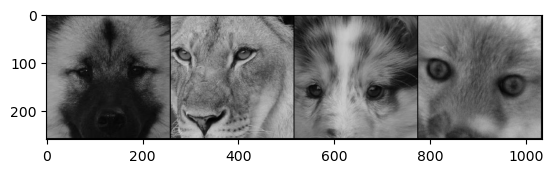

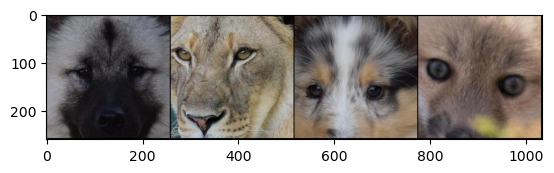

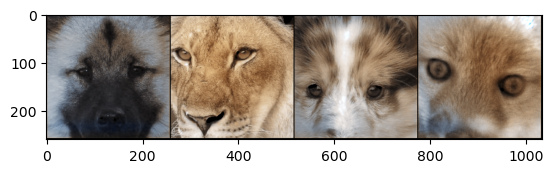

Epoch 1: Step 6600: Generator (U-Net) loss: 10.487769258022311, Discriminator loss: 0.5517060119658711


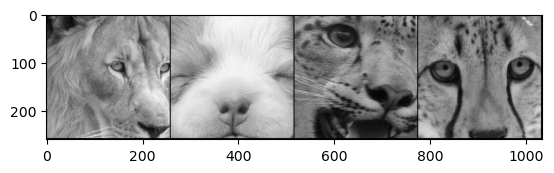

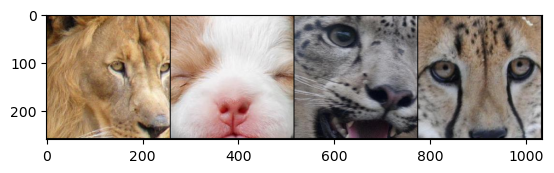

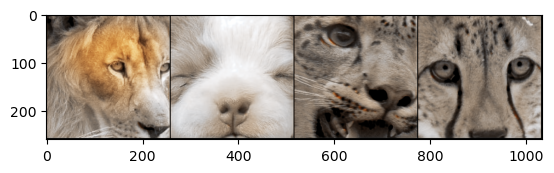

Epoch 1: Step 6800: Generator (U-Net) loss: 10.764153225421907, Discriminator loss: 0.5318432252854107


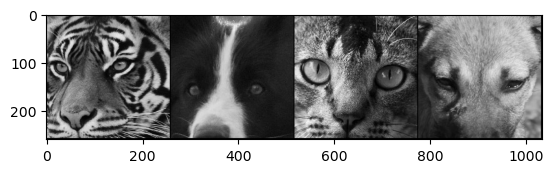

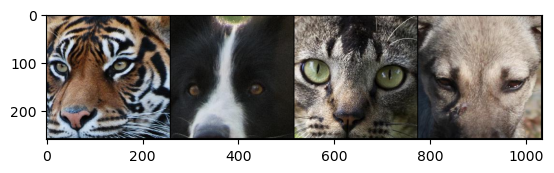

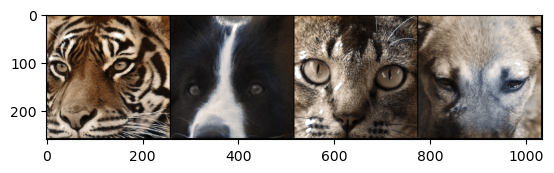

Epoch 1: Step 7000: Generator (U-Net) loss: 10.554043071269989, Discriminator loss: 0.5265130903199313


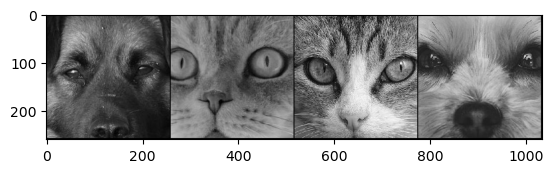

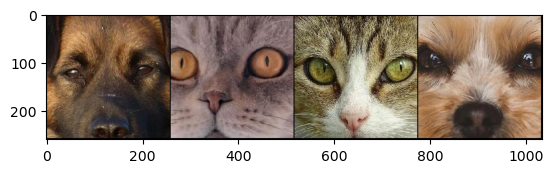

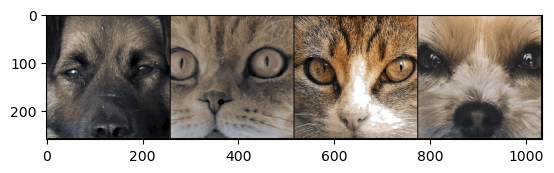

Epoch 1: Step 7200: Generator (U-Net) loss: 10.662281217575078, Discriminator loss: 0.5277694392949343


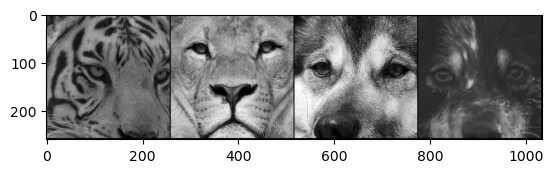

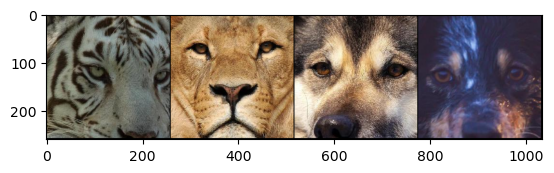

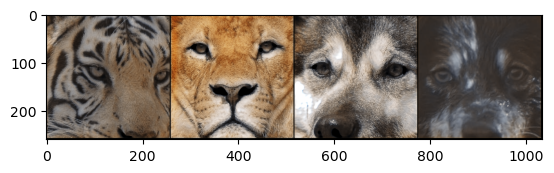

  0%|          | 0/3658 [00:00<?, ?it/s]

Epoch 2: Step 7400: Generator (U-Net) loss: 10.383013589382168, Discriminator loss: 0.5472710564732555


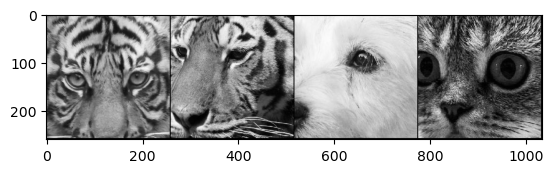

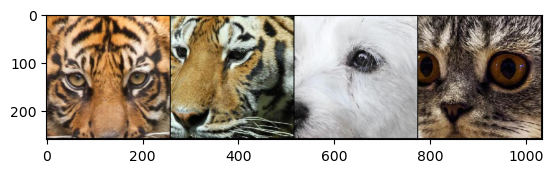

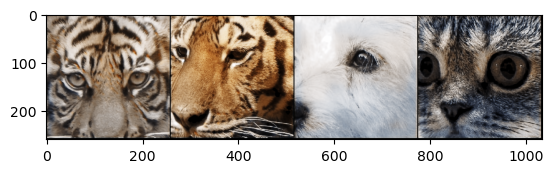

Epoch 2: Step 7600: Generator (U-Net) loss: 10.309115297794344, Discriminator loss: 0.5278593392297626


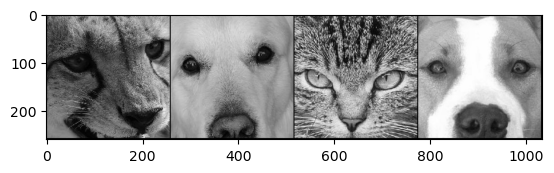

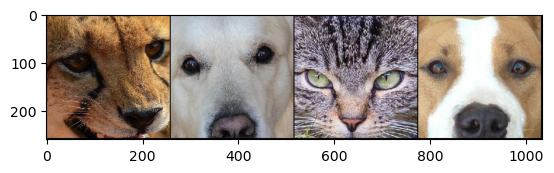

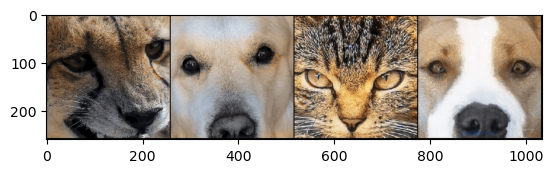

Epoch 2: Step 7800: Generator (U-Net) loss: 10.228516077995298, Discriminator loss: 0.5704646335542201


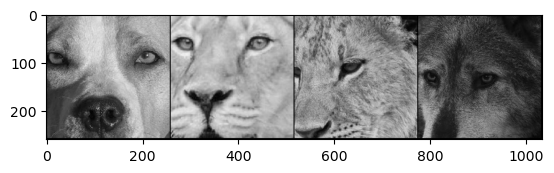

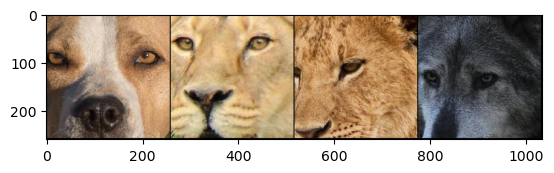

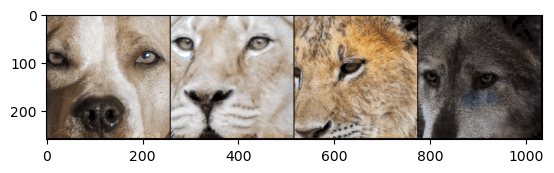

Epoch 2: Step 8000: Generator (U-Net) loss: 10.7977080988884, Discriminator loss: 0.5275398583337665


In [ ]:
#from skimage import color
import numpy as np

t=transforms.Grayscale(3)
def train(save_model=False):
    mean_generator_loss = 18
    mean_discriminator_loss = 0.002
    dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)
    cur_step = 0

    for epoch in range(n_epochs):
        # Dataloader returns the batches
        for image, _ in tqdm(dataloader):
            image_width = image.shape[3]
            real = image[:, :, :, :]
            real = nn.functional.interpolate(real, size=target_shape)
            condition = image[:, :, :,:]
            condition = nn.functional.interpolate(condition, size=target_shape)
            condition=t(condition)
            cur_batch_size = len(condition)
            condition = condition.to(device)
            real = real.to(device)

            disc_opt.zero_grad() # Zero out the gradient before backpropagation
            with torch.no_grad():
                fake = gen(condition)
            disc_fake_hat = disc(fake.detach(), condition) # Detach generator
            disc_fake_loss = adv_criterion(disc_fake_hat, torch.zeros_like(disc_fake_hat))
            disc_real_hat = disc(real, condition)
            disc_real_loss = adv_criterion(disc_real_hat, torch.ones_like(disc_real_hat))
            disc_loss = (disc_fake_loss + disc_real_loss) / 2
            disc_loss.backward(retain_graph=True) # Update gradients
            disc_opt.step() # Update optimizer

            
            gen_opt.zero_grad()
            gen_loss = get_gen_loss(gen, disc, real, condition, adv_criterion, recon_criterion, lambda_recon)
            gen_loss.backward() # Update gradients
            gen_opt.step() # Update optimizer

            # Keep track of the average discriminator loss
            mean_discriminator_loss += disc_loss.item() / display_step
            # Keep track of the average generator loss
            mean_generator_loss += gen_loss.item() / display_step

            ### Visualization code ###
            if cur_step % display_step == 0:
                if cur_step > 0:
                    print(f"Epoch {epoch}: Step {cur_step}: Generator (U-Net) loss: {mean_generator_loss}, Discriminator loss: {mean_discriminator_loss}")
                else:
                    print("Pretrained initial state")
                show_tensor_images(condition, size=(input_dim, target_shape, target_shape))
                show_tensor_images(real, size=(real_dim, target_shape, target_shape))
                show_tensor_images(fake, size=(real_dim, target_shape, target_shape))
                mean_generator_loss = 0
                mean_discriminator_loss = 0
                # You can change save_model to True if you'd like to save the model
                if save_model:
                    torch.save({'gen': gen.state_dict(),
                        'gen_opt': gen_opt.state_dict(),
                        'disc': disc.state_dict(),
                        'disc_opt': disc_opt.state_dict()
                    }, f"pix2pix_{cur_step}.pth")
            cur_step += 1
train()